In [1]:
import sys
sys.path.append("..")

import os
import math
import json
import cv2

import numpy as np
import pprint as pp
import json as JSON
import pandas as pd
import pandas_gbq

from shapely.geometry import Point, Polygon
from dotenv import load_dotenv
from matplotlib import pyplot as plt

from sid_modules.helperFunctions import BigQueryHelper, ConversionHelper, TestingHelper,  MapsImage, District, Village, OSMBuilding,SIDBuilding

load_dotenv()

bqh = BigQueryHelper()
cnv = ConversionHelper()
ts = TestingHelper()

In [2]:
# import data bases
images_df = bqh.loadImages()
osm_buildings_df = bqh.loadOSMBuildings()
sid_buildings_df = bqh.loadSIDBuildings()

print('')
print('Nb of images/villages analysed : ' + str(images_df.shape[0]))
print('Nb of buildings imported from OSM : ' + str(osm_buildings_df.shape[0]))
print('Nb of buildings detected by analysis : ' + str(sid_buildings_df.shape[0]))

Downloading: 100%|██████████| 331/331 [00:00<00:00, 1508.74rows/s]Nb of images/villages analysed : 5
Nb of buildings imported from OSM : 402
Nb of buildings detected by analysis : 331



Total buildings in OSM : 402
Total buildings by ML_analysis : 80
Total buildings by color_analysis : 251
62
./images/Monnon_5_19_500.png
7
./images/Sansi Gando_5_19_500.png
8
./images/Besen Gourou_5_19_500.png
2
./images/Barkedje_5_19_500.png
1
./images/Boudal_5_19_500.png


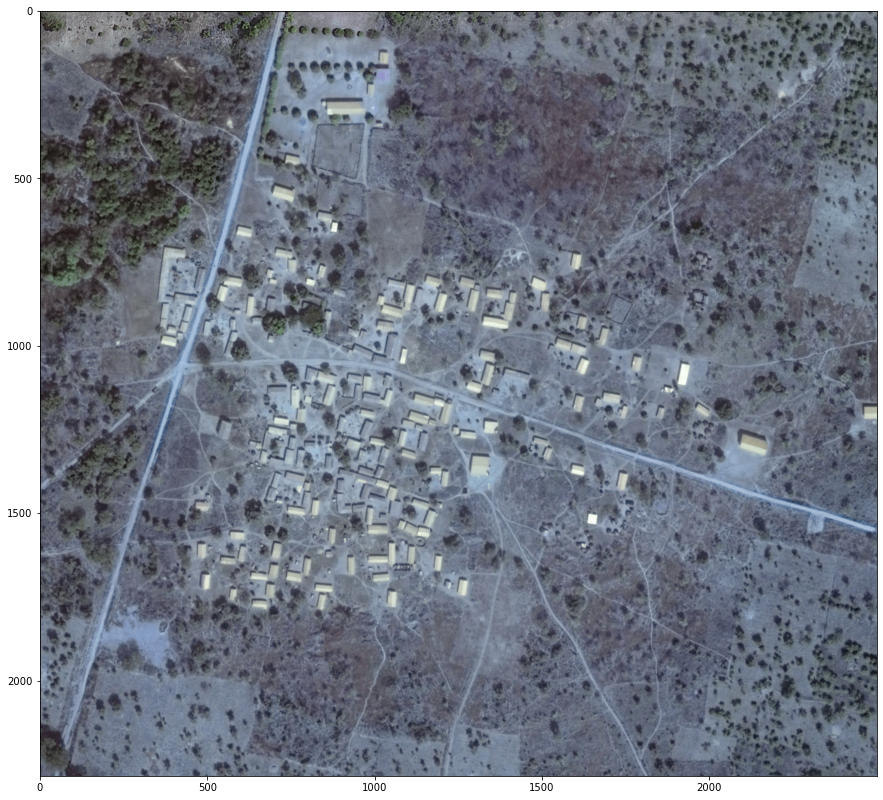

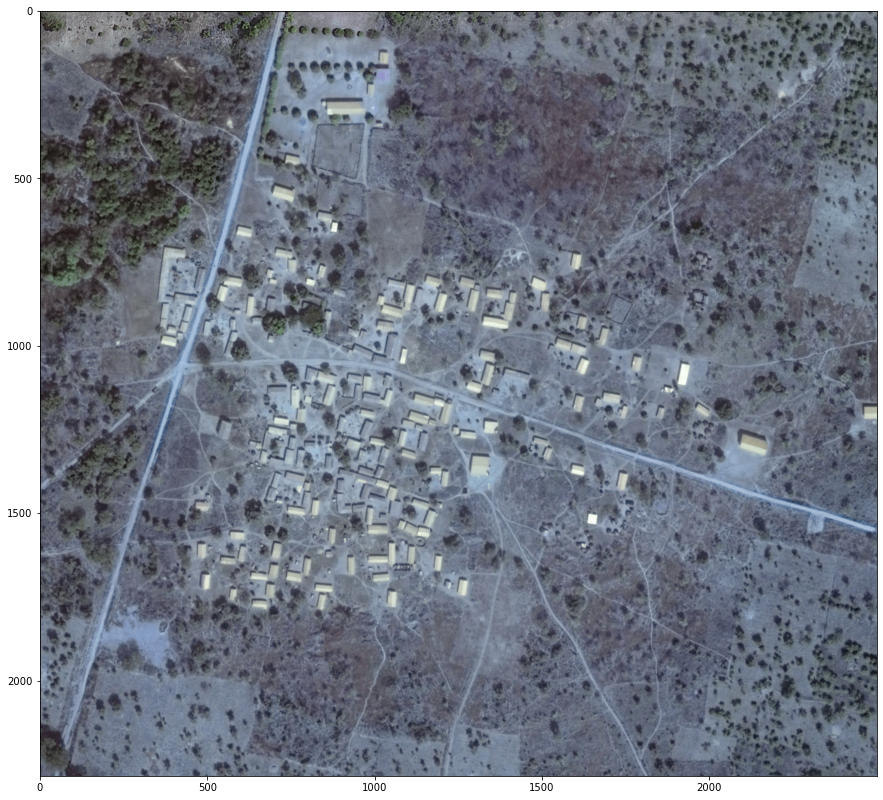

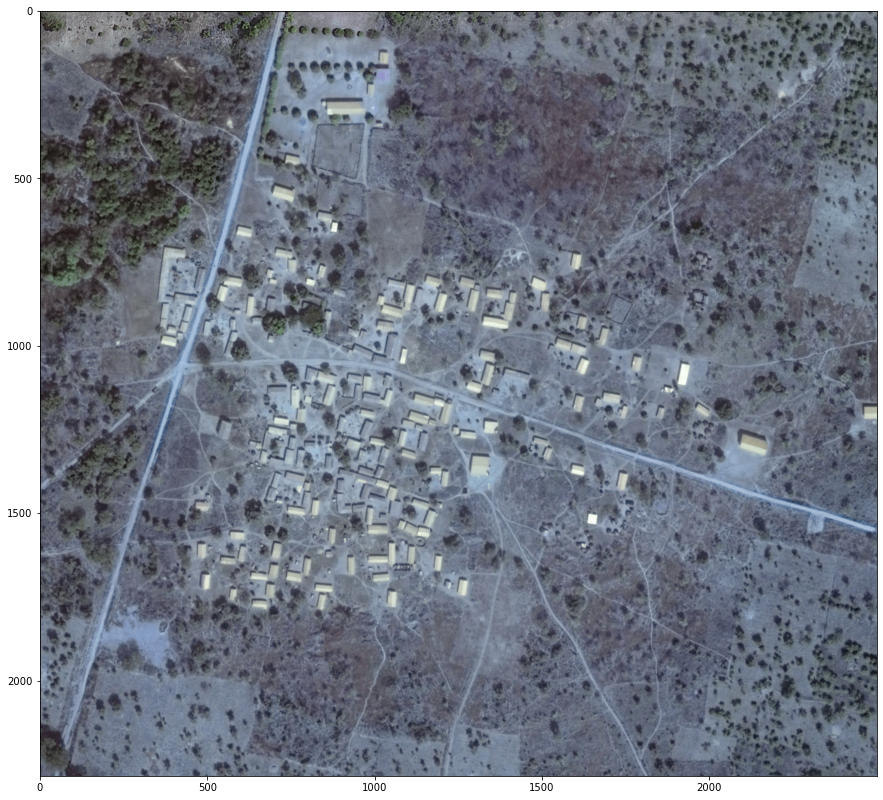

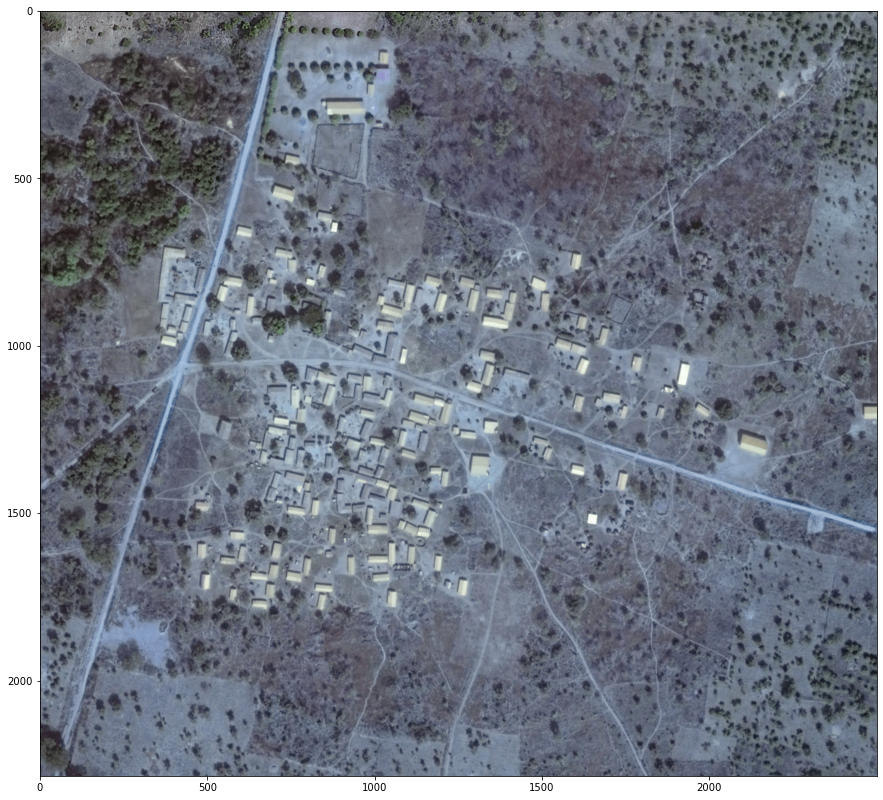

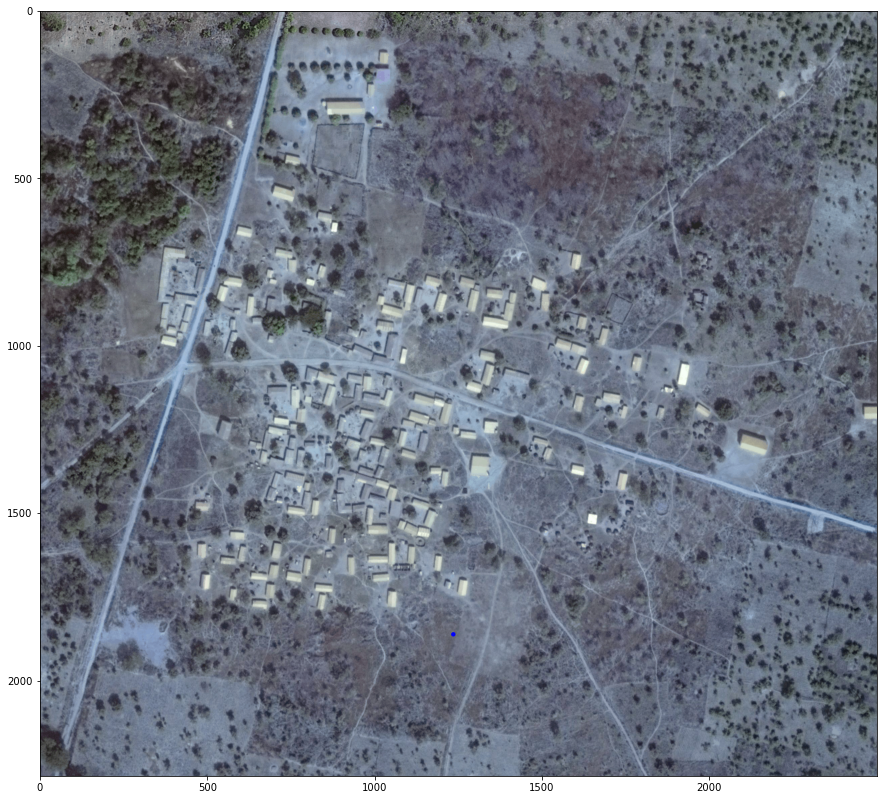

In [11]:
# Data analysis

def basic_quantitative_analysis():
    group_df = sid_buildings_df.groupby(['analysis_method']).count()
    print('Total buildings in OSM : ' + str(osm_buildings_df.shape[0]))

    for index, row in group_df.iterrows():
        print('Total buildings by ' + str(row.name) + ' : ' + str(row['lat']))


def basic_qualitative_analysis():
    for index, image_row in images_df.iterrows():
        image_ref = str('./images/' + image_row['img_name'])

        df_for_village = sid_buildings_df[ 
            (sid_buildings_df['village'] == image_row['name']) & 
            (sid_buildings_df['analysis_method'] == 'ML_analysis')
            ]
        print(len(df_for_village))
        print(image_ref)
        ts.show_points_in_img(cnv , df_for_village['lat'].tolist() , df_for_village['lon'].tolist() , image_ref , image_row, 'b')

basic_quantitative_analysis()
basic_qualitative_analysis()

(1319.0629048266069, 2092.3436899463577)

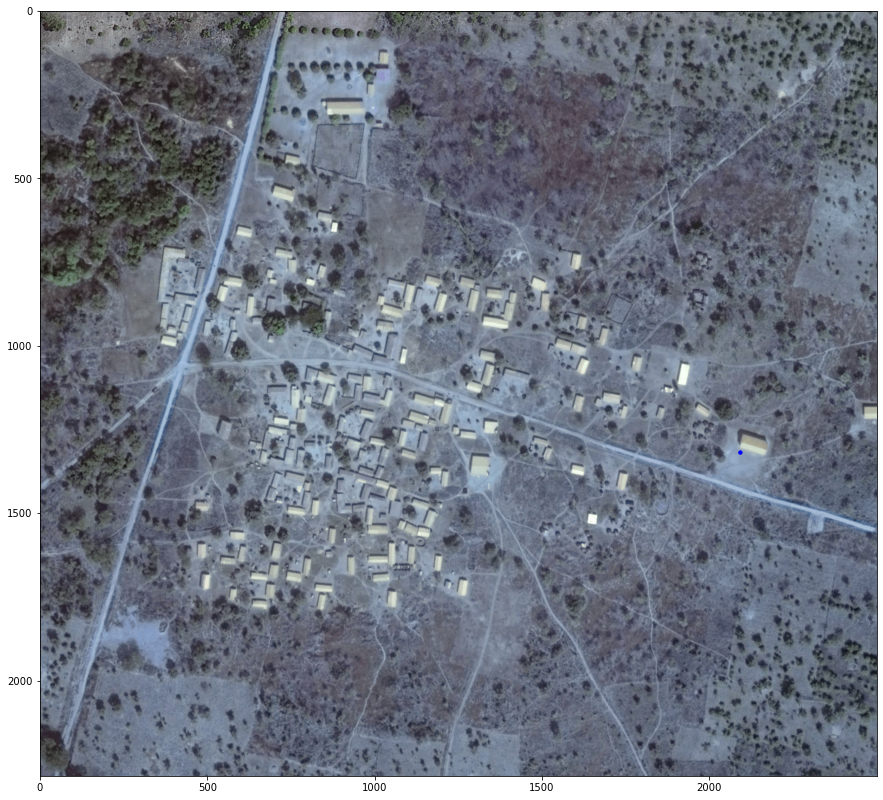

In [20]:
row_ref = images_df.iloc[0]
image_ref = './images/' + row_ref['img_name']

ts.show_point_in_img(cnv, 9.842138, 3.181120, image_ref, row_ref)